## load dependencies

In [2]:
## Initialzing and loading required libraries and subfunctions
import numpy as np
import matplotlib.pyplot as plt
import copy
import yasa
from mne.filter import resample
import pynapple as nap
import seaborn as sns
import pandas as pd
from sklearn.preprocessing import normalize
import requests
from io import BytesIO
import sails
import re
from scipy.stats import entropy

import scipy
from scipy import signal
from scipy.interpolate import griddata
from scipy.signal import correlate
from scipy.stats import pearsonr
from scipy.fft import fft
from scipy.spatial.distance import euclidean
from scipy.signal import spectrogram
from scipy.io import loadmat
import scipy.fft
import scipy.stats
import scipy.io as sio
from scipy.signal import hilbert

import emd as emd
import emd.sift as sift
import emd.spectra as spectra

from neurodsp.sim import sim_combined
from neurodsp.plts import plot_time_series, plot_timefrequency
from neurodsp.utils import create_times
from neurodsp.timefrequency.wavelets import compute_wavelet_transform
from neurodsp.filt import filter_signal

# Load required libraries
import numpy as np
from scipy.io import loadmat
from scipy.signal import hilbert
from scipy.interpolate import interp1d
import matplotlib.pyplot as plt
import seaborn as sns
from neurodsp.filt import filter_signal, filter_signal_fir, design_fir_filter
import emd
import pandas as pd
from sklearn.preprocessing import Normalizer
from tqdm import tqdm
import plotly.express as px
import copy
import umap.umap_ as umap
import skdim
from scipy.spatial import cKDTree
import pickle

## UTILS
from utils import *
from detect_pt import *

from scipy.io import loadmat
import numpy as np
from neurodsp.filt import filter_signal
import copy
import emd
from scipy.spatial import cKDTree
from tqdm import tqdm

sns.set(style='white', context='notebook')

# Ultimate analysis

In [3]:
path_to_hpc = '/Users/amir/Desktop/for Abdel/OS Basic/6/Study_day6_HC_28feb2018/Post_trial5_2018-02-28_13-42-34/HPC_100_CH2.continuous.mat'
path_to_states = '/Users/amir/Desktop/for Abdel/OS Basic/6/Study_day6_HC_28feb2018/Post_trial5_2018-02-28_13-42-34/post_trial5_2018-02-28_13-42-34-states.mat'

In [4]:
import os
import re

def extract_experiment_info(path_to_hpc):

    path_parts = os.path.normpath(path_to_hpc).split(os.sep)

    try:
        idx_for_abdel = path_parts.index('for Abdel')
    except ValueError:
        raise ValueError("The path does not contain 'for Abdel' directory.")

    dataset_type = path_parts[idx_for_abdel + 1]

    rat_number = path_parts[idx_for_abdel + 2]

    treatment_part = path_parts[idx_for_abdel + 3]
    if '_' not in treatment_part and ' ' not in treatment_part:

        treatment = treatment_part
    else:

        tokens = re.split(r'[_\-]', treatment_part)

        tokens = [t for t in tokens if not re.match(r'Rat\d*|SD\d*|Rat|Ephys|OS', t, re.IGNORECASE)]

        non_numeric_tokens = [t for t in tokens if not t.isdigit()]
        if non_numeric_tokens:

            treatment = non_numeric_tokens[-1]
        else:
            treatment = 'Unknown'

    post_trial_folder = path_parts[-2]
    post_trial_match = re.search(r'post_trial(\d+)', post_trial_folder, re.IGNORECASE)
    if post_trial_match:
        post_trial = post_trial_match.group(1)
    else:
        post_trial = 'Unknown'

    return {
        'dataset_type': dataset_type,
        'rat_number': rat_number,
        'treatment': treatment,
        'post_trial': post_trial
    }

In [4]:
dataset_info = extract_experiment_info(path_to_hpc)
print(dataset_info)

NameError: name 'path_to_hpc' is not defined

In [5]:
dataset_info = {'dataset_type': 'OS Basic', 'rat_number': '6', 'treatment': 'HC', 'post_trial': '5'}

In [6]:
dataset_info['dataset_type']

'OS Basic'

In [35]:
config = emd.sift.SiftConfig.from_yaml_file('/Users/amir/Desktop/for Abdel/emd_masksift_CA1_config_2500.yml')

In [ ]:
lfpHPC, hypno, fs = get_data(path_to_hpc, path_to_states)

There was 0 in the dataset


In [10]:
fs

2500

In [5]:
def extract_pt_intervals(lfpHPC, hypno, fs=2500):
    targetFs = 500
    n_down = fs / targetFs
    start, end = get_start_end(hypno=hypno, sleep_state_id=5)
    rem_interval = nap.IntervalSet(start=start, end=end)
    fs = int(n_down * targetFs)
    t = np.arange(0, len(lfpHPC) / fs, 1 / fs)
    lfp = nap.TsdFrame(t=t, d=lfpHPC, columns=['HPC'])

    # Detect phasic intervals
    lfpHPC_down = preprocess(lfpHPC, n_down)
    phREM = detect_phasic(lfpHPC_down, hypno, targetFs)

    # Create phasic REM IntervalSet
    start, end = [], []
    for rem_idx in phREM:
        for s, e in phREM[rem_idx]:
            start.append(s / targetFs)
            end.append(e / targetFs)
    phasic_interval = nap.IntervalSet(start, end)

    # Calculate tonic intervals
    tonic_interval = rem_interval.set_diff(phasic_interval)
    print(f'Number of detected Tonic intrevals:{len(tonic_interval)}')
    # Apply a 100 ms duration threshold to tonic intervals
    min_duration = 0.1  # 100 ms in seconds
    durations = tonic_interval['end'] - tonic_interval['start']
    valid_intervals = durations >= min_duration
    tonic_interval = nap.IntervalSet(tonic_interval['start'][valid_intervals], tonic_interval['end'][valid_intervals])
    print(f'Number of detected Tonic intrevals after threshold:{len(tonic_interval)}')
    return phasic_interval, tonic_interval, lfp

In [10]:
phasic_interval, tonic_interval, lfp = extract_pt_intervals(lfpHPC, hypno)

Number of detected Tonic intrevals:44
Number of detected Tonic intrevals after threshold:44


In [11]:
tonic_imfs, tonic_imfs_freqs, tonic_rem_lpf = extract_imfs_by_pt_intervals(lfp, fs, tonic_interval, config, return_imfs_freqs=True)

In [12]:
phasic_imfs, phasic_imfs_freqs, rem_lpf = extract_imfs_by_pt_intervals(lfp, fs, phasic_interval, config, return_imfs_freqs=True)

In [6]:
def get_cycle_data(imf5, fs=2500):
    cycle_data = {"fs": None, 'theta_imf': None,
                       "IP": None, "IF": None, "IP": None, "cycles": None}


    # Get cycles using IP
    IP, IF, IA = emd.spectra.frequency_transform(imf5, fs, 'hilbert')
    C = emd.cycles.Cycles(IP)
    cycles = get_cycles_with_metrics(C, imf5, IA, IF)

    cycle_data['fs'] = fs
    cycle_data['theta_imf'] = imf5
    cycle_data['IP'] = IP
    cycle_data['IF'] = IF
    cycle_data['IA'] = IA
    cycle_data['cycles'] = cycles
    return cycle_data

In [16]:
start, end = get_start_end(hypno=hypno, sleep_state_id=5)
rem_interval = nap.IntervalSet(start=start, end=end)

# Extract IMFs during REM sleep
rem_imfs, rem_imfs_freqs, rem_lpf = extract_imfs_by_pt_intervals(
    lfp, fs, rem_interval, config, return_imfs_freqs=True
)

In [7]:
# version 1

def prepare_data_for_umap(imfs, imf_frequencies):

  waveforms = pd.DataFrame()
  all_trials = pd.DataFrame()
  all_FPPs = []

  theta_range = [5, 12]
  frequencies = np.arange(15, 141, 1)
  angles=np.linspace(-180,180,19)
  fs = 2500

  for idx, imf in enumerate(imfs):
    cycle_data = get_cycle_data(imf[:, 5], fs=2500)

    amp_thresh = np.percentile(cycle_data['IA'], 25) # higher than 25th percentile of the data
    lo_freq_duration = fs/5  # restrict the analysis to 5-12 Hz
    hi_freq_duration = fs/17

    conditions = ['is_good==1',
                        f'duration_samples<{lo_freq_duration}',
                        f'duration_samples>{hi_freq_duration}',
                        f'max_amp>{amp_thresh}']
    print(len(cycle_data['theta_imf']))
    all_cycles = get_cycles_with_conditions(cycle_data['cycles'], conditions)
    
    # Check if any cycles satisfy the conditions
    if all_cycles is None or all_cycles.chain_vect.size == 0:
        print("No cycles satisfy the conditions.")
        return pd.DataFrame(), pd.DataFrame(), []
    
    subset_cycles_df = all_cycles.get_metric_dataframe(subset=True)
    subset_indices = subset_cycles_df['index'].values

    all_cycles_inds = get_cycle_inds(all_cycles, subset_indices)
    cycles_inds = arrange_cycle_inds(all_cycles_inds)

    freqs = imf_frequencies[idx]
    sub_theta, theta, supra_theta = tg_split(freqs, theta_range)
    supra_theta_sig = np.sum(imf.T[supra_theta], axis=0)

    # # Corrected Wavelet Transform Computation
    raw_data=sails.wavelet.morlet(supra_theta_sig, freqs=frequencies, sample_rate=fs, ncycles=5,ret_mode='power', normalise=None)
    supraPlot = scipy.stats.zscore(raw_data, axis=1)
    FPP = bin_tf_to_fpp(cycles_inds, supraPlot, bin_count=19)
    all_FPPs.append(FPP)

    # Compute mode frequency for each cycle
    mode_freqs, entropies = compute_mode_frequency_and_entropy(FPP, frequencies, angles)

    all_waveforms, _ = emd.cycles.phase_align(cycle_data['IP'], cycle_data['theta_imf'],
                                                            cycles=all_cycles.iterate(through='subset'), npoints=100)
    all_waveforms = pd.DataFrame(all_waveforms.T)

    waveforms = pd.concat([waveforms, all_waveforms])

    trial = all_cycles.get_metric_dataframe(subset=True)
    trial['mode_freqs'] = mode_freqs
    trial['entropy'] = entropies
    all_trials = pd.concat([all_trials, trial])

  return waveforms, all_trials, all_FPPs

In [8]:
def prepare_rem_data_for_umap(imfs, imf_frequencies):
    waveforms = pd.DataFrame()
    all_trials = pd.DataFrame()
    all_FPPs = []

    theta_range = [5, 12]
    frequencies = np.arange(15, 141, 1)
    angles = np.linspace(-180, 180, 19)
    fs = 2500

    for idx, imf in enumerate(imfs):
        cycle_data = get_cycle_data(imf[:, 5], fs=2500)

        amp_thresh = np.percentile(cycle_data['IA'], 25)
        lo_freq_duration = fs/5
        hi_freq_duration = fs/17

        conditions = ['is_good==1',
                      f'duration_samples<{lo_freq_duration}',
                      f'duration_samples>{hi_freq_duration}',
                      f'max_amp>{amp_thresh}']

        all_cycles = get_cycles_with_conditions(cycle_data['cycles'], conditions)

        subset_cycles_df = all_cycles.get_metric_dataframe(subset=True)
        subset_indices = subset_cycles_df['index'].values

        all_cycles_inds = get_cycle_inds(all_cycles, subset_indices)
        cycles_inds = arrange_cycle_inds(all_cycles_inds)

        freqs = imf_frequencies[idx]
        sub_theta, theta, supra_theta = tg_split(freqs, theta_range)
        supra_theta_sig = np.sum(imf.T[supra_theta], axis=0)

        raw_data = sails.wavelet.morlet(supra_theta_sig, freqs=frequencies, sample_rate=fs, ncycles=5, ret_mode='power', normalise=None)
        supraPlot = scipy.stats.zscore(raw_data, axis=1)
        FPP = bin_tf_to_fpp(cycles_inds, supraPlot, bin_count=19)
        all_FPPs.append(FPP)

        mode_freqs, entropies = compute_mode_frequency_and_entropy(FPP, frequencies, angles)

        all_waveforms, _ = emd.cycles.phase_align(cycle_data['IP'], cycle_data['theta_imf'],
                                                  cycles=all_cycles.iterate(through='subset'), npoints=100)
        all_waveforms = pd.DataFrame(all_waveforms.T)

        waveforms = pd.concat([waveforms, all_waveforms])

        trial = all_cycles.get_metric_dataframe(subset=True)
        trial['mode_freqs'] = mode_freqs
        trial['entropy'] = entropies
        all_trials = pd.concat([all_trials, trial])

    return waveforms, all_trials, all_FPPs

In [19]:
rem_waveforms, rem_trials, rem_FPPs = prepare_rem_data_for_umap(rem_imfs, rem_imfs_freqs)

 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking phase_align inputs - trimming singleton 

In [20]:
print(rem_waveforms.shape)

(7761, 100)


In [21]:
rem_waveforms = np.array(rem_waveforms)

In [22]:
ID = np.round(np.nanmean(abids(rem_waveforms, 50)))
ID

3.0

In [23]:
umap_embedder = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=ID, metric='euclidean', random_state=42)
embedding_rem = umap_embedder.fit_transform(rem_waveforms)

def project_cycles(waveforms, embedder):
    return embedder.transform(waveforms)

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [24]:
phasic_waveforms, phasic_trials, _ = prepare_data_for_umap(phasic_imfs, phasic_imfs_freqs)
tonic_waveforms, tonic_trials, _ = prepare_data_for_umap(tonic_imfs, tonic_imfs_freqs)

phasic_embedding = project_cycles(phasic_waveforms, umap_embedder)
tonic_embedding = project_cycles(tonic_waveforms, umap_embedder)

 Checking Cycles inputs - trimming singleton from input 'IP'
4185
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking Cycles inputs - trimming singleton from input 'IP'
3065
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking Cycles inputs - trimming singleton from input 'IP'
3285
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking Cycles inputs - trimming singleton from input 'IP'
9940
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking Cycles inputs - trimming singleton from input 'IP'
5545
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking Cycles inputs - trimming singleton from input 'IP'
7060
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking Cycles inputs - trimming singleton from input 'IP'
9500
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking Cycles inputs - trimming singleton from input 'IP'
11420
 Checking

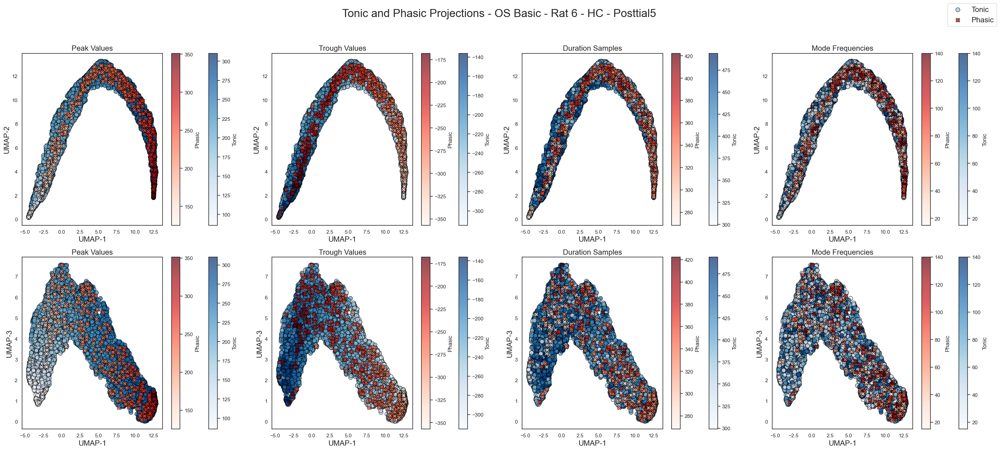

In [28]:
metrics = ['peak_values', 'trough_values', 'duration_samples', 'mode_freqs']
titles = ['Peak Values', 'Trough Values', 'Duration Samples', 'Mode Frequencies']

tonic_cmap = 'Blues'
phasic_cmap = 'Reds'

f, ax = plt.subplots(2, 4, figsize=(30, 14))

for i, metric in enumerate(metrics):
    # Tonic episodes
    scatter_tonic = ax[0, i].scatter(tonic_embedding[:, 0], tonic_embedding[:, 1],
                                     c=tonic_trials[metric],
                                     vmin=np.percentile(tonic_trials[metric], 1),
                                     vmax=np.percentile(tonic_trials[metric], 99),
                                     cmap=tonic_cmap, s=80, label='Tonic', alpha=0.7, edgecolor='black')

    # Phasic episodes
    scatter_phasic = ax[0, i].scatter(phasic_embedding[:, 0], phasic_embedding[:, 1],
                                      c=phasic_trials[metric],
                                      vmin=np.percentile(phasic_trials[metric], 1),
                                      vmax=np.percentile(phasic_trials[metric], 99),
                                      cmap=phasic_cmap, s=80, label='Phasic', marker='X', alpha=0.7, edgecolor='black')

    ax[0, i].set_xlabel('UMAP-1', fontsize=16)
    ax[0, i].set_ylabel('UMAP-2', fontsize=16)
    ax[0, i].set_title(titles[i], fontsize=16)

    f.colorbar(scatter_tonic, ax=ax[0, i], label='Tonic', orientation='vertical')
    f.colorbar(scatter_phasic, ax=ax[0, i], label='Phasic', orientation='vertical')

    # UMAP-1 vs UMAP-3
    scatter_tonic = ax[1, i].scatter(tonic_embedding[:, 0], tonic_embedding[:, 2],
                                     c=tonic_trials[metric],
                                     vmin=np.percentile(tonic_trials[metric], 1),
                                     vmax=np.percentile(tonic_trials[metric], 99),
                                     cmap=tonic_cmap, s=80, label='Tonic', alpha=0.7, edgecolor='black')

    scatter_phasic = ax[1, i].scatter(phasic_embedding[:, 0], phasic_embedding[:, 2],
                                      c=phasic_trials[metric],
                                      vmin=np.percentile(phasic_trials[metric], 1),
                                      vmax=np.percentile(phasic_trials[metric], 99),
                                      cmap=phasic_cmap, s=80, label='Phasic', marker='X', alpha=0.7, edgecolor='black')

    ax[1, i].set_xlabel('UMAP-1', fontsize=16)
    ax[1, i].set_ylabel('UMAP-3', fontsize=16)
    ax[1, i].set_title(titles[i], fontsize=16)

    f.colorbar(scatter_tonic, ax=ax[1, i], label='Tonic', orientation='vertical')
    f.colorbar(scatter_phasic, ax=ax[1, i], label='Phasic', orientation='vertical')

handles, labels = ax[0, 0].get_legend_handles_labels()
f.legend(handles, ['Tonic', 'Phasic'], loc='upper right', fontsize=16)

plt.suptitle(f"Tonic and Phasic Projections - {dataset_info['dataset_type']} - Rat {dataset_info['rat_number']} - {dataset_info['treatment']} - Posttial{dataset_info['post_trial']}", fontsize=24)
plt.savefig(f"tonic_and_phasic_projections_{dataset_info['dataset_type']}_rat{dataset_info['rat_number']}_{dataset_info['treatment']}_posttial{dataset_info['post_trial']}.svg")
f.tight_layout(rect=[0, 0.03, 1, 0.95])

plt.show()

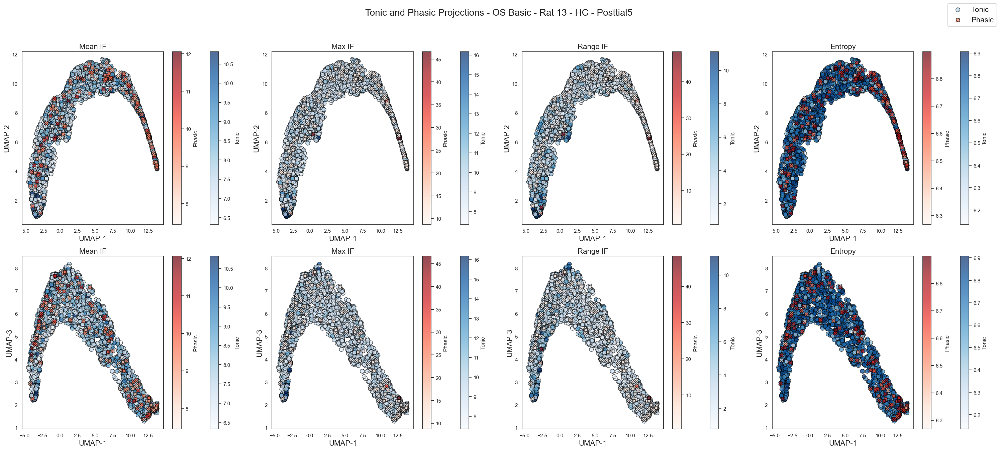

In [252]:
metrics = ['mean_if', 'max_if', 'range_if', 'entropy']
titles = ['Mean IF', 'Max IF', 'Range IF', 'Entropy']

tonic_cmap = 'Blues'
phasic_cmap = 'Reds'

f, ax = plt.subplots(2, 4, figsize=(30, 14))

for i, metric in enumerate(metrics):
    # Tonic episodes
    scatter_tonic = ax[0, i].scatter(tonic_embedding[:, 0], tonic_embedding[:, 1],
                                     c=tonic_trials[metric],
                                     vmin=np.percentile(tonic_trials[metric], 1),
                                     vmax=np.percentile(tonic_trials[metric], 99),
                                     cmap=tonic_cmap, s=80, label='Tonic', alpha=0.7, edgecolor='black')

    # Phasic episodes
    scatter_phasic = ax[0, i].scatter(phasic_embedding[:, 0], phasic_embedding[:, 1],
                                      c=phasic_trials[metric],
                                      vmin=np.percentile(phasic_trials[metric], 1),
                                      vmax=np.percentile(phasic_trials[metric], 99),
                                      cmap=phasic_cmap, s=80, label='Phasic', marker='X', alpha=0.7, edgecolor='black')

    ax[0, i].set_xlabel('UMAP-1', fontsize=16)
    ax[0, i].set_ylabel('UMAP-2', fontsize=16)
    ax[0, i].set_title(titles[i], fontsize=16)

    f.colorbar(scatter_tonic, ax=ax[0, i], label='Tonic', orientation='vertical')
    f.colorbar(scatter_phasic, ax=ax[0, i], label='Phasic', orientation='vertical')

    # UMAP-1 vs UMAP-3
    scatter_tonic = ax[1, i].scatter(tonic_embedding[:, 0], tonic_embedding[:, 2],
                                     c=tonic_trials[metric],
                                     vmin=np.percentile(tonic_trials[metric], 1),
                                     vmax=np.percentile(tonic_trials[metric], 99),
                                     cmap=tonic_cmap, s=80, label='Tonic', alpha=0.7, edgecolor='black')

    scatter_phasic = ax[1, i].scatter(phasic_embedding[:, 0], phasic_embedding[:, 2],
                                      c=phasic_trials[metric],
                                      vmin=np.percentile(phasic_trials[metric], 1),
                                      vmax=np.percentile(phasic_trials[metric], 99),
                                      cmap=phasic_cmap, s=80, label='Phasic', marker='X', alpha=0.7, edgecolor='black')

    ax[1, i].set_xlabel('UMAP-1', fontsize=16)
    ax[1, i].set_ylabel('UMAP-3', fontsize=16)
    ax[1, i].set_title(titles[i], fontsize=16)

    f.colorbar(scatter_tonic, ax=ax[1, i], label='Tonic', orientation='vertical')
    f.colorbar(scatter_phasic, ax=ax[1, i], label='Phasic', orientation='vertical')

handles, labels = ax[0, 0].get_legend_handles_labels()
f.legend(handles, ['Tonic', 'Phasic'], loc='upper right', fontsize=16)

# plt.suptitle(f"Tonic and Phasic Projections - {dataset_info['dataset_type']} - Rat {dataset_info['rat_number']} - {dataset_info['treatment']} - Posttial{dataset_info['post_trial']}", fontsize=20)
# plt.savefig(f"tonic_and_phasic_projections_{dataset_info['dataset_type']}_rat{dataset_info['rat_number']}_{dataset_info['treatment']}_posttial{dataset_info['post_trial']}_entropy.svg")

plt.suptitle(f"Tonic and Phasic Projections - {dataset_info['dataset_type']} - Rat {dataset_info['rat_number']} - HC - Posttial{dataset_info['post_trial']}", fontsize=20)
plt.savefig(f"tonic_and_phasic_projections_{dataset_info['dataset_type']}_rat{dataset_info['rat_number']}_HC_posttial{dataset_info['post_trial']}_entropy.svg")
f.tight_layout(rect=[0, 0.03, 1, 0.95])

plt.show()

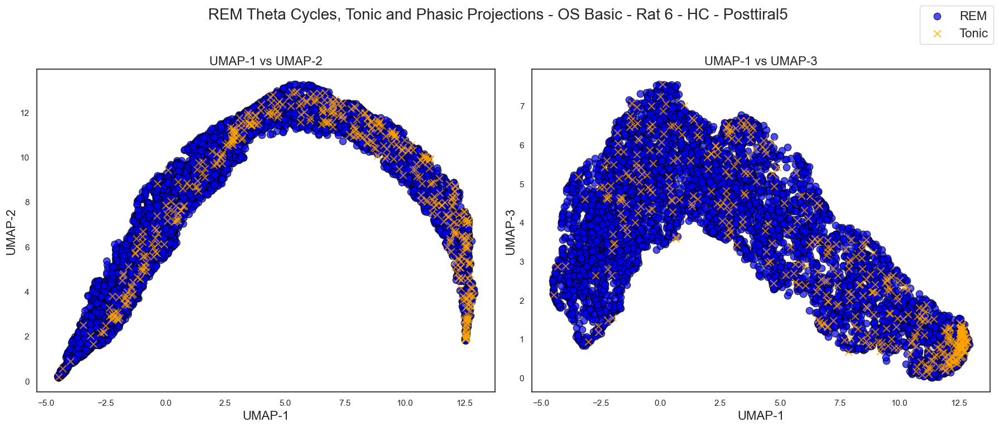

In [26]:
rem_color = 'purple'
tonic_color = 'blue'
phasic_color = 'orange'

f, ax = plt.subplots(1, 2, figsize=(18, 8))

# Plot UMAP-1 vs UMAP-2
# REM episodes
# scatter_rem = ax[0].scatter(embedding_rem[:, 0], embedding_rem[:, 1],
#                             c=rem_color, label='REM', s=80, alpha=0.3)

# Tonic episodes
scatter_tonic = ax[0].scatter(tonic_embedding[:, 0], tonic_embedding[:, 1],
                              c=tonic_color, label='Tonic', s=80, alpha=0.7, edgecolor='black')

# Phasic episodes
scatter_phasic = ax[0].scatter(phasic_embedding[:, 0], phasic_embedding[:, 1],
                               c=phasic_color, label='Phasic', marker='x', s=80, alpha=0.7, edgecolor='black')

ax[0].set_xlabel('UMAP-1', fontsize=16)
ax[0].set_ylabel('UMAP-2', fontsize=16)
ax[0].set_title('UMAP-1 vs UMAP-2', fontsize=16)

# Plot UMAP-1 vs UMAP-3
# scatter_rem = ax[1].scatter(embedding_rem[:, 0], embedding_rem[:, 2],
#                             c=rem_color, label='REM', s=80, alpha=0.3)

scatter_tonic = ax[1].scatter(tonic_embedding[:, 0], tonic_embedding[:, 2],
                              c=tonic_color, label='Tonic', s=80, alpha=0.7, edgecolor='black')

scatter_phasic = ax[1].scatter(phasic_embedding[:, 0], phasic_embedding[:, 2],
                               c=phasic_color, label='Phasic', marker='x', s=80, alpha=0.7, edgecolor='black')

ax[1].set_xlabel('UMAP-1', fontsize=16)
ax[1].set_ylabel('UMAP-3', fontsize=16)
ax[1].set_title('UMAP-1 vs UMAP-3', fontsize=16)

handles, labels = ax[0].get_legend_handles_labels()
f.legend(handles, ['REM', 'Tonic', 'Phasic'], loc='upper right', fontsize=16)

plt.suptitle(f"REM Theta Cycles, Tonic and Phasic Projections - {dataset_info['dataset_type']} - Rat {dataset_info['rat_number']} - {dataset_info['treatment']} - Posttiral{dataset_info['post_trial']}", fontsize=20)
plt.savefig(f"rem_theta_with_phasic_and_tonic_projections_{dataset_info['dataset_type']}_rat{dataset_info['rat_number']}_{dataset_info['treatment']}_Posttiral{dataset_info['post_trial']}.svg")
f.tight_layout(rect=[0, 0.03, 1, 0.95])

plt.show()

# Trial analysis

In [101]:
path_to_trial2_lfp = '/Users/amir/Desktop/for Abdel/OS Basic/13/Rat_OS_Ephys_Rat13_344994_SD2_HC_15_05_2019/2019-05-15_11-37-30_post_trial2/HPC_100_CH8_0.continuous.mat'
path_to_trial2_state = '/Users/amir/Desktop/for Abdel/OS Basic/13/Rat_OS_Ephys_Rat13_344994_SD2_HC_15_05_2019/2019-05-15_11-37-30_post_trial2/2019-05-15_11-37-30_post_trial2-states.mat'

path_to_trial3_lfp = '/Users/amir/Desktop/for Abdel/OS Basic/13/Rat_OS_Ephys_Rat13_344994_SD2_HC_15_05_2019/2019-05-15_12-27-45_post_trial3/HPC_100_CH8_0.continuous.mat'
path_to_trial3_state = '/Users/amir/Desktop/for Abdel/OS Basic/13/Rat_OS_Ephys_Rat13_344994_SD2_HC_15_05_2019/2019-05-15_12-27-45_post_trial3/2019-05-15_12-27-45_post_trial3-states.mat'

path_to_trial4_lfp = '/Users/amir/Desktop/for Abdel/OS Basic/13/Rat_OS_Ephys_Rat13_344994_SD2_HC_15_05_2019/2019-05-15_13-17-54_post_trial4/HPC_100_CH8_0.continuous.mat'
path_to_trial4_state = '/Users/amir/Desktop/for Abdel/OS Basic/13/Rat_OS_Ephys_Rat13_344994_SD2_HC_15_05_2019/2019-05-15_13-17-54_post_trial4/2019-05-15_13-17-54_post_trial4-states.mat'

path_to_trial5_lfp = '/Users/amir/Desktop/for Abdel/OS Basic/13/Rat_OS_Ephys_Rat13_344994_SD2_HC_15_05_2019/2019-05-15_14-08-14_post_trial5/HPC_100_CH8_0.continuous.mat'
path_to_trial5_state = '/Users/amir/Desktop/for Abdel/OS Basic/13/Rat_OS_Ephys_Rat13_344994_SD2_HC_15_05_2019/2019-05-15_14-08-14_post_trial5/2019-05-15_14-08-14_post_trial5-states.mat'

In [102]:
dataset_info = extract_experiment_info(path_to_trial5_lfp)
print(dataset_info)

{'dataset_type': 'OS Basic', 'rat_number': '13', 'treatment': 'HC', 'post_trial': '5'}


In [103]:
fs=2500

In [104]:
lfpHPC2, hypno2, _ = get_data(path_to_trial2_lfp, path_to_trial2_state)
lfpHPC3, hypno3, _ = get_data(path_to_trial3_lfp, path_to_trial3_state)
lfpHPC4, hypno4, _ = get_data(path_to_trial4_lfp, path_to_trial4_state)
lfpHPC5, hypno5, _ = get_data(path_to_trial5_lfp, path_to_trial5_state)

There was 0 in the dataset
There was 0 in the dataset
There was 0 in the dataset


In [105]:
phasic_interval2, tonic_interval2, lfp2 = extract_pt_intervals(lfpHPC2, hypno2)
#phasic_interval2, tonic_interval2, lfp2 = [[], [], []]
phasic_interval3, tonic_interval3, lfp3 = extract_pt_intervals(lfpHPC3, hypno3)
#phasic_interval3, tonic_interval3, lfp3 = [[], [], []]
phasic_interval4, tonic_interval4, lfp4 = extract_pt_intervals(lfpHPC4, hypno4)
phasic_interval5, tonic_interval5, lfp5 = extract_pt_intervals(lfpHPC5, hypno5)

Number of detected Tonic intrevals:9
Number of detected Tonic intrevals after threshold:8
Number of detected Tonic intrevals:10
Number of detected Tonic intrevals after threshold:10
Number of detected Tonic intrevals:4
Number of detected Tonic intrevals after threshold:4
Number of detected Tonic intrevals:16
Number of detected Tonic intrevals after threshold:16


In [106]:
tonic_imfs2, tonic_imfs_freqs2, tonic_rem_lpf2 = extract_imfs_by_pt_intervals(lfp2, fs, tonic_interval2, config, return_imfs_freqs=True)
tonic_imfs3, tonic_imfs_freqs3, tonic_rem_lpf3 = extract_imfs_by_pt_intervals(lfp3, fs, tonic_interval3, config, return_imfs_freqs=True)
tonic_imfs4, tonic_imfs_freqs4, tonic_rem_lpf4 = extract_imfs_by_pt_intervals(lfp4, fs, tonic_interval4, config, return_imfs_freqs=True)
tonic_imfs5, tonic_imfs_freqs5, tonic_rem_lpf5 = extract_imfs_by_pt_intervals(lfp5, fs, tonic_interval5, config, return_imfs_freqs=True)

In [107]:
phasic_imfs2, phasic_imfs_freqs2, rem_lpf2 = extract_imfs_by_pt_intervals(lfp2, fs, phasic_interval2, config, return_imfs_freqs=True)
phasic_imfs3, phasic_imfs_freqs3, rem_lpf3 = extract_imfs_by_pt_intervals(lfp3, fs, phasic_interval3, config, return_imfs_freqs=True)
phasic_imfs4, phasic_imfs_freqs4, rem_lpf4 = extract_imfs_by_pt_intervals(lfp4, fs, phasic_interval4, config, return_imfs_freqs=True)
phasic_imfs5, phasic_imfs_freqs5, rem_lpf5 = extract_imfs_by_pt_intervals(lfp5, fs, phasic_interval5, config, return_imfs_freqs=True)

In [108]:
# Initialize empty DataFrames for concatenation
all_phasic_waveforms = pd.DataFrame()
all_phasic_trials = pd.DataFrame()
all_tonic_waveforms = pd.DataFrame()
all_tonic_trials = pd.DataFrame()

# List of trials and intervals for easier looping
phasic_imfs_list = [phasic_imfs2, phasic_imfs3, phasic_imfs4, phasic_imfs5]
phasic_freqs_list = [phasic_imfs_freqs2, phasic_imfs_freqs3, phasic_imfs_freqs4, phasic_imfs_freqs5]
tonic_imfs_list = [tonic_imfs2, tonic_imfs3, tonic_imfs4, tonic_imfs5]
tonic_freqs_list = [tonic_imfs_freqs2, tonic_imfs_freqs3, tonic_imfs_freqs4, tonic_imfs_freqs5]

# Loop over trials to extract waveforms and trials data
for i, (phasic_imfs, phasic_freqs, tonic_imfs, tonic_freqs) in enumerate(zip(phasic_imfs_list, phasic_freqs_list, tonic_imfs_list, tonic_freqs_list)):
    phasic_waveforms, phasic_trials, _ = prepare_data_for_umap(phasic_imfs, phasic_freqs)
    tonic_waveforms, tonic_trials, _ = prepare_data_for_umap(tonic_imfs, tonic_freqs)
    
    # Add trial index for color-coding in UMAP
    phasic_waveforms['posttrial'] = i + 1
    phasic_trials['posttrial'] = i + 1
    tonic_waveforms['posttrial'] = i + 1
    tonic_trials['posttrial'] = i + 1

    # Concatenate across trials
    all_phasic_waveforms = pd.concat([all_phasic_waveforms, phasic_waveforms], ignore_index=True)
    all_phasic_trials = pd.concat([all_phasic_trials, phasic_trials], ignore_index=True)
    all_tonic_waveforms = pd.concat([all_tonic_waveforms, tonic_waveforms], ignore_index=True)
    all_tonic_trials = pd.concat([all_tonic_trials, tonic_trials], ignore_index=True)

# Step 2: Combine Phasic and Tonic Waveforms for UMAP Embedding
combined_waveforms = pd.concat([all_phasic_waveforms, all_tonic_waveforms], ignore_index=True)
combined_waveforms = combined_waveforms.drop(columns=['posttrial']).to_numpy()  # Drop 'trial' column for UMAP

 Checking Cycles inputs - trimming singleton from input 'IP'
2815
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking Cycles inputs - trimming singleton from input 'IP'
5495
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking Cycles inputs - trimming singleton from input 'IP'
10335
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking Cycles inputs - trimming singleton from input 'IP'
11000
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking Cycles inputs - trimming singleton from input 'IP'
7325
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking Cycles inputs - trimming singleton from input 'IP'
123020
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking Cycles inputs - trimming singleton from input 'IP'
51135
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking Cycles inputs - trimming singleton from input 'IP'
18250
 Che

In [109]:
# # Step 3: Determine ID for UMAP Embedding (Dimensionality Reduction)
# ID = np.round(np.nanmean(abids(combined_waveforms, 50)))

In [110]:
ID = 3

In [111]:
# Apply UMAP to the Combined Waveforms
umap_embedder = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=int(ID), metric='euclidean', random_state=42)
embedding_rem = umap_embedder.fit_transform(combined_waveforms)

In [112]:
# Transform phasic and tonic waveforms individually using the fitted UMAP embedder
phasic_projection = umap_embedder.transform(all_phasic_waveforms.drop(columns=['posttrial']).to_numpy())
tonic_projection = umap_embedder.transform(all_tonic_waveforms.drop(columns=['posttrial']).to_numpy())

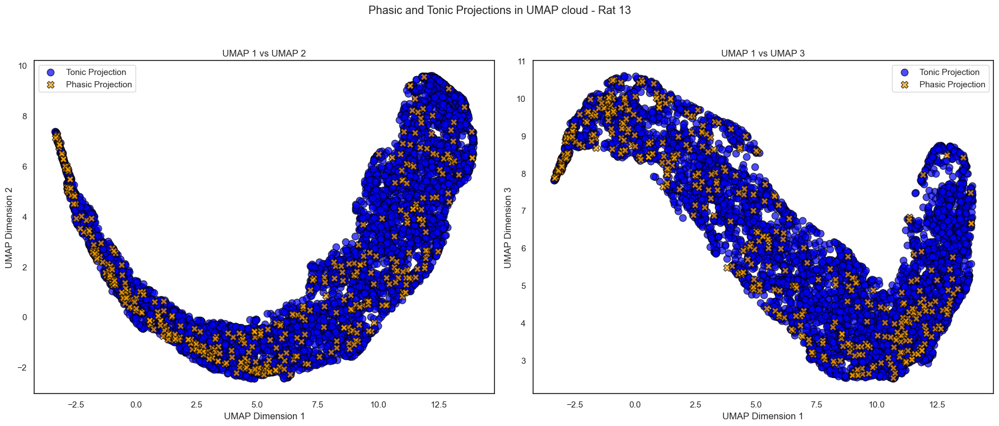

In [113]:
import matplotlib.pyplot as plt

# Create the figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

# First subplot: UMAP 1 vs UMAP 2
axes[0].scatter(tonic_projection[:, 0], tonic_projection[:, 1], color="blue", s=80, alpha=0.7, label="Tonic Projection", edgecolor='black')
axes[0].scatter(phasic_projection[:, 0], phasic_projection[:, 1], color="orange", s=80, alpha=0.7, marker='X', label="Phasic Projection", edgecolor='black')
axes[0].set_xlabel("UMAP Dimension 1")
axes[0].set_ylabel("UMAP Dimension 2")
axes[0].set_title("UMAP 1 vs UMAP 2")
axes[0].legend()

# Second subplot: UMAP 1 vs UMAP 3
axes[1].scatter(tonic_projection[:, 0], tonic_projection[:, 2], color="blue", s=80, alpha=0.7, label="Tonic Projection", edgecolor='black')
axes[1].scatter(phasic_projection[:, 0], phasic_projection[:, 2], color="orange", s=80, alpha=0.7, marker='X', label="Phasic Projection", edgecolor='black')
axes[1].set_xlabel("UMAP Dimension 1")
axes[1].set_ylabel("UMAP Dimension 3")
axes[1].set_title("UMAP 1 vs UMAP 3")
axes[1].legend()

# Display the plot
plt.suptitle(f"Phasic and Tonic Projections in UMAP cloud - Rat {dataset_info['rat_number']}")
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.savefig(f"UMAP_for_rat{dataset_info['rat_number']}.svg")
plt.show()

# whole rat analysis

In [12]:
import os
import pandas as pd

def extract_data_for_rat(rat_id):
    # Define the base path to OS Basic datasets
    base_path = '/Users/amir/Desktop/for Abdel/OS Basic'
    treatments = ['CN', 'HC', 'OD', 'OR']
    fs = 2500  # Sample frequency
    
    # Initialize empty DataFrames for concatenation across all treatments and trials for the specified rat
    all_combined_waveforms = pd.DataFrame()
    all_combined_trials = pd.DataFrame()
    
    rat_path = os.path.join(base_path, str(rat_id))
    
    # Check if the specified rat folder exists
    if not os.path.isdir(rat_path):
        print(f"Rat folder {rat_id} does not exist.")
        return None, None
    
    # Loop over each treatment for the specified rat
    for treatment in treatments:
        treatment_path = os.path.join(rat_path, treatment)
        
        # Initialize DataFrames for each treatment
        treatment_phasic_waveforms = pd.DataFrame()
        treatment_phasic_trials = pd.DataFrame()
        treatment_tonic_waveforms = pd.DataFrame()
        treatment_tonic_trials = pd.DataFrame()
        
        # Check if the treatment folder exists
        if not os.path.isdir(treatment_path):
            print(f"Treatment folder '{treatment}' for Rat {rat_id} does not exist. Skipping...")
            continue
        
        # Detect all trial folders in the treatment directory and filter for Post_Trial2 to Post_Trial5
        trial_folders = [
            f for f in os.listdir(treatment_path)
            if os.path.isdir(os.path.join(treatment_path, f)) and
            any(f"Post_Trial{num}" in f for num in range(2, 6))
        ]
        
        for trial_folder in trial_folders:
            trial_path = os.path.join(treatment_path, trial_folder)
            
            # Search for LFP and state files in the trial folder
            lfp_file = None
            state_file = None
            
            for file_name in os.listdir(trial_path):
                if 'HPC' in file_name and file_name.endswith('.mat'):
                    lfp_file = os.path.join(trial_path, file_name)
                elif 'states' in file_name and file_name.endswith('.mat'):
                    state_file = os.path.join(trial_path, file_name)
            
            # Ensure both LFP and state files were found
            if not lfp_file or not state_file:
                print(f"Missing LFP or state file in {trial_path}. Skipping...")
                continue
            
            # Extract trial number from folder name (assuming format "Post_TrialX")
            trial_number = int(trial_folder.split('Trial')[-1])
            
            # Load data using custom functions
            try:
                lfpHPC, hypno, _ = get_data(lfp_file, state_file)
                
                # Extract phasic and tonic intervals, handling cases with no REM sleep
                try:
                    phasic_interval, tonic_interval, lfp = extract_pt_intervals(lfpHPC, hypno)
                except ValueError as e:
                    print(f"No REM sleep found in {trial_folder} for Rat {rat_id}, Treatment {treatment}. Filling with empty intervals.")
                    phasic_interval, tonic_interval, lfp = [[], [], []]
                
                # Extract IMFs and frequencies for phasic and tonic intervals if intervals are not empty
                if phasic_interval and tonic_interval:
                    tonic_imfs, tonic_freqs, tonic_lpf = extract_imfs_by_pt_intervals(lfp, fs, tonic_interval, config, return_imfs_freqs=True)
                    phasic_imfs, phasic_freqs, phasic_lpf = extract_imfs_by_pt_intervals(lfp, fs, phasic_interval, config, return_imfs_freqs=True)
                    
                    # Prepare UMAP data for both phasic and tonic
                    phasic_waveforms, phasic_trials, _ = prepare_data_for_umap(phasic_imfs, phasic_freqs)
                    tonic_waveforms, tonic_trials, _ = prepare_data_for_umap(tonic_imfs, tonic_freqs)
                    
                    # Add metadata columns, including cycle type labels
                    phasic_waveforms['rat_id'] = rat_id
                    phasic_waveforms['treatment'] = treatment
                    phasic_waveforms['trial'] = trial_number
                    phasic_waveforms['cycle_type'] = 'phasic'
                    
                    tonic_waveforms['rat_id'] = rat_id
                    tonic_waveforms['treatment'] = treatment
                    tonic_waveforms['trial'] = trial_number
                    tonic_waveforms['cycle_type'] = 'tonic'
                    
                    phasic_trials['rat_id'] = rat_id
                    phasic_trials['treatment'] = treatment
                    phasic_trials['trial'] = trial_number
                    phasic_trials['cycle_type'] = 'phasic'
                    
                    tonic_trials['rat_id'] = rat_id
                    tonic_trials['treatment'] = treatment
                    tonic_trials['trial'] = trial_number
                    tonic_trials['cycle_type'] = 'tonic'
                    
                    # Concatenate into treatment-specific DataFrames
                    treatment_phasic_waveforms = pd.concat([treatment_phasic_waveforms, phasic_waveforms], ignore_index=True)
                    treatment_phasic_trials = pd.concat([treatment_phasic_trials, phasic_trials], ignore_index=True)
                    treatment_tonic_waveforms = pd.concat([treatment_tonic_waveforms, tonic_waveforms], ignore_index=True)
                    treatment_tonic_trials = pd.concat([treatment_tonic_trials, tonic_trials], ignore_index=True)
            
            except FileNotFoundError:
                print(f"Data not found in {trial_path}. Skipping...")
        
        # Combine treatment DataFrames for phasic and tonic
        combined_treatment_waveforms = pd.concat([treatment_phasic_waveforms, treatment_tonic_waveforms], ignore_index=True)
        combined_treatment_trials = pd.concat([treatment_phasic_trials, treatment_tonic_trials], ignore_index=True)
        
        # Add treatment data to the rat-level DataFrames
        all_combined_waveforms = pd.concat([all_combined_waveforms, combined_treatment_waveforms], ignore_index=True)
        all_combined_trials = pd.concat([all_combined_trials, combined_treatment_trials], ignore_index=True)
    
    # Drop trial column for UMAP embedding
    
    
    return all_combined_waveforms, all_combined_trials

In [46]:
rat_id = '6'  # Replace with the desired rat ID
waveforms_df, trials_df = extract_data_for_rat(rat_id)

In [15]:
is_phasic = waveforms_df['cycle_type'] == 'phasic'

KeyError: 'cycle_type'

In [52]:
len([value for i, value in enumerate(is_phasic) if value])

2899

In [20]:
ID = 3

In [53]:
combined_waveforms = waveforms_df.drop(columns=['treatment', 'rat_id', 'trial', 'cycle_type']).to_numpy() 

In [54]:
# Apply UMAP to the Combined Waveforms
umap_embedder = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=int(ID), metric='euclidean', random_state=42)
embedding_rem = umap_embedder.fit_transform(combined_waveforms)

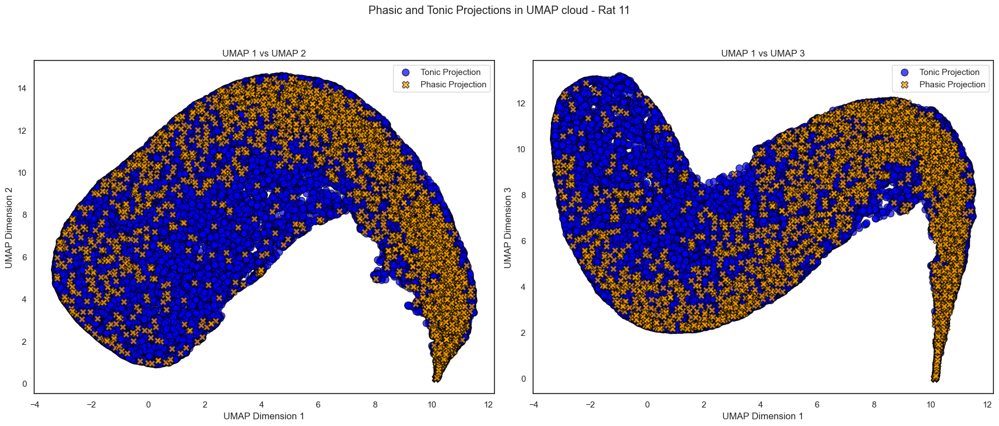

In [55]:
# Merge embedding results with trials data to identify phasic and tonic projections
embedding_df = pd.DataFrame(embedding_rem, columns=["UMAP1", "UMAP2", "UMAP3"])
labeled_embedding = pd.concat([embedding_df, trials_df[['cycle_type']].reset_index(drop=True)], axis=1)

# Separate projections for phasic and tonic cycles
tonic_projection = labeled_embedding[labeled_embedding['cycle_type'] == 'tonic'][["UMAP1", "UMAP2", "UMAP3"]].to_numpy()
phasic_projection = labeled_embedding[labeled_embedding['cycle_type'] == 'phasic'][["UMAP1", "UMAP2", "UMAP3"]].to_numpy()

# Plotting the UMAP projections
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

# First subplot: UMAP 1 vs UMAP 2
axes[0].scatter(tonic_projection[:, 0], tonic_projection[:, 1], color="blue", s=80, alpha=0.7, label="Tonic Projection", edgecolor='black')
axes[0].scatter(phasic_projection[:, 0], phasic_projection[:, 1], color="orange", s=80, alpha=0.7, marker='X', label="Phasic Projection", edgecolor='black')
axes[0].set_xlabel("UMAP Dimension 1")
axes[0].set_ylabel("UMAP Dimension 2")
axes[0].set_title("UMAP 1 vs UMAP 2")
axes[0].legend()

# Second subplot: UMAP 1 vs UMAP 3
axes[1].scatter(tonic_projection[:, 0], tonic_projection[:, 2], color="blue", s=80, alpha=0.7, label="Tonic Projection", edgecolor='black')
axes[1].scatter(phasic_projection[:, 0], phasic_projection[:, 2], color="orange", s=80, alpha=0.7, marker='X', label="Phasic Projection", edgecolor='black')
axes[1].set_xlabel("UMAP Dimension 1")
axes[1].set_ylabel("UMAP Dimension 3")
axes[1].set_title("UMAP 1 vs UMAP 3")
axes[1].legend()

# Display the plot
plt.suptitle(f"Phasic and Tonic Projections in UMAP cloud - Rat {rat_id}")
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.savefig(f"UMAP_for_rat_{rat_id}.svg")
plt.show()

# ...

In [72]:
import os
import pandas as pd
import re

def extract_data_for_rat(rat_id):
    # Define the base path to OS Basic datasets
    base_path = '/Users/amir/Desktop/for Abdel/OS Basic'
    fs = 2500  # Sample frequency

    # Initialize empty DataFrames for concatenation across all recordings and trials for the specified rat
    all_combined_waveforms = pd.DataFrame()
    all_combined_trials = pd.DataFrame()

    rat_path = os.path.join(base_path, str(rat_id))

    # Check if the specified rat folder exists
    if not os.path.isdir(rat_path):
        print(f"Rat folder {rat_id} does not exist.")
        return None, None

    # List all recording folders in the rat directory
    recording_folders = [
        f for f in os.listdir(rat_path)
        if os.path.isdir(os.path.join(rat_path, f))
    ]

    if not recording_folders:
        print(f"No recording folders found for Rat {rat_id}.")
        return None, None

    # Loop over each recording folder
    for recording_folder in recording_folders:
        print(f"Processing recording folder: {recording_folder}")
        recording_path = os.path.join(rat_path, recording_folder)

        # Use regular expressions to parse the folder name
        match = re.match(r'^Rat-OS-Ephys_(Rat\d+)_SD(\d+)_(\w+)_([\d-]+)$', recording_folder)
        if not match:
            print(f"Unexpected folder name format: {recording_folder}. Skipping...")
            continue

        rat_id_part = match.group(1)       # e.g., 'Rat6'
        sd_number = match.group(2)         # e.g., '4'
        condition = match.group(3)         # e.g., 'CON'
        date_part = match.group(4)         # e.g., '22-02-2018'

        rat_id_from_folder = ''.join(filter(str.isdigit, rat_id_part))

        # Check if rat_id_from_folder matches rat_id
        if rat_id_from_folder != str(rat_id):
            print(f"Rat ID mismatch in folder {recording_folder}. Expected Rat{rat_id}, found Rat{rat_id_from_folder}. Skipping...")
            continue

        # Detect all trial folders and filter for post_trial2 to post_trial5, considering various folder name formats
        trial_folders = [
            f for f in os.listdir(recording_path)
            if os.path.isdir(os.path.join(recording_path, f)) and
            re.search(r'(?i)post[\-_]?trial[\-_]?([2-5])', f)
        ]

        if not trial_folders:
            print(f"No trial folders found in {recording_folder}.")
            continue

        for trial_folder in trial_folders:
            print(f"Processing trial folder: {trial_folder}")
            trial_path = os.path.join(recording_path, trial_folder)

            # Search for LFP and state files in the trial folder
            lfp_file = None
            state_file = None

            for file_name in os.listdir(trial_path):
                if 'HPC' in file_name and file_name.endswith('.mat'):
                    lfp_file = os.path.join(trial_path, file_name)
                elif 'states' in file_name and file_name.endswith('.mat'):
                    state_file = os.path.join(trial_path, file_name)
                elif 'States' in file_name and file_name.endswith('.mat'):
                    state_file = os.path.join(trial_path, file_name)

            # Ensure both LFP and state files were found
            if not lfp_file or not state_file:
                print(f"Missing LFP or state file in {trial_path}. Skipping...")
                continue

            # Extract trial number from folder name
            trial_number_match = re.search(r'(?i)post[\-_]?trial[\-_]?([2-5])', trial_folder)
            if trial_number_match:
                trial_number = int(trial_number_match.group(1))
            else:
                print(f"Unable to extract trial number from folder name: {trial_folder}. Skipping...")
                continue

            # Load data using custom functions
            try:
                lfpHPC, hypno, _ = get_data(lfp_file, state_file)

                # Extract phasic and tonic intervals, handling cases with no REM sleep
                try:
                    phasic_interval, tonic_interval, lfp = extract_pt_intervals(lfpHPC, hypno)
                except ValueError as e:
                    print(f"No REM sleep found in {trial_folder} for Rat {rat_id}, Condition {condition}. Filling with empty intervals.")
                    phasic_interval, tonic_interval, lfp = [[], [], []]

                # Extract IMFs and frequencies for phasic and tonic intervals if intervals are not empty
                if phasic_interval and tonic_interval:
                    # Assume 'config' is defined elsewhere in your code
                    tonic_imfs, tonic_freqs, tonic_lpf = extract_imfs_by_pt_intervals(
                        lfp, fs, tonic_interval, config, return_imfs_freqs=True)
                    phasic_imfs, phasic_freqs, phasic_lpf = extract_imfs_by_pt_intervals(
                        lfp, fs, phasic_interval, config, return_imfs_freqs=True)

                    # Prepare UMAP data for both phasic and tonic
                    phasic_waveforms, phasic_trials, _ = prepare_data_for_umap(phasic_imfs, phasic_freqs)
                    tonic_waveforms, tonic_trials, _ = prepare_data_for_umap(tonic_imfs, tonic_freqs)

                    # Add metadata columns, including cycle type labels
                    for df in [phasic_waveforms, phasic_trials]:
                        df['rat_id'] = rat_id
                        df['condition'] = condition
                        df['trial'] = trial_number
                        df['cycle_type'] = 'phasic'
                        df['SD'] = sd_number
                        df['date'] = date_part

                    for df in [tonic_waveforms, tonic_trials]:
                        df['rat_id'] = rat_id
                        df['condition'] = condition
                        df['trial'] = trial_number
                        df['cycle_type'] = 'tonic'
                        df['SD'] = sd_number
                        df['date'] = date_part

                    # Concatenate into combined DataFrames
                    all_combined_waveforms = pd.concat(
                        [all_combined_waveforms, phasic_waveforms, tonic_waveforms], ignore_index=True)
                    all_combined_trials = pd.concat(
                        [all_combined_trials, phasic_trials, tonic_trials], ignore_index=True)

            except FileNotFoundError:
                print(f"Data not found in {trial_path}. Skipping...")

    if all_combined_waveforms.empty:
        print(f"No data extracted for Rat {rat_id}.")
        return None, None

    return all_combined_waveforms, all_combined_trials

In [76]:
rat_id = '13'  # Replace with the desired rat ID
waveforms_df, trials_df = extract_data_for_rat(rat_id)

Processing recording folder: Rat-OS-Ephys_Rat13_SD2_HC_15-05-2019
Processing trial folder: 2019-05-15_14-08-14_post_trial5
There was 0 in the dataset
Number of detected Tonic intrevals:16
Number of detected Tonic intrevals after threshold:16
 Checking Cycles inputs - trimming singleton from input 'IP'
3969
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking Cycles inputs - trimming singleton from input 'IP'
8456
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking Cycles inputs - trimming singleton from input 'IP'
7830
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking Cycles inputs - trimming singleton from input 'IP'
3365
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking Cycles inputs - trimming singleton from input 'IP'
7655
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking Cycles inputs - trimming singleton from input 'IP'
3040
 Checking phase_align inputs - t

In [64]:
# Prepare features for UMAP embedding
features = waveforms_df.drop(columns=['rat_id', 'condition', 'trial', 'cycle_type', 'SD', 'date'])

# Apply UMAP to the features
umap_embedder = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=3, metric='euclidean', random_state=42)
embedding_rem = umap_embedder.fit_transform(features.to_numpy())

# Create embedding DataFrame
embedding_df = pd.DataFrame(embedding_rem, columns=["UMAP1", "UMAP2", "UMAP3"])

# Combine embeddings with metadata
metadata = waveforms_df[['rat_id', 'condition', 'trial', 'cycle_type', 'SD', 'date']].reset_index(drop=True)
labeled_embedding = pd.concat([embedding_df, metadata], axis=1)

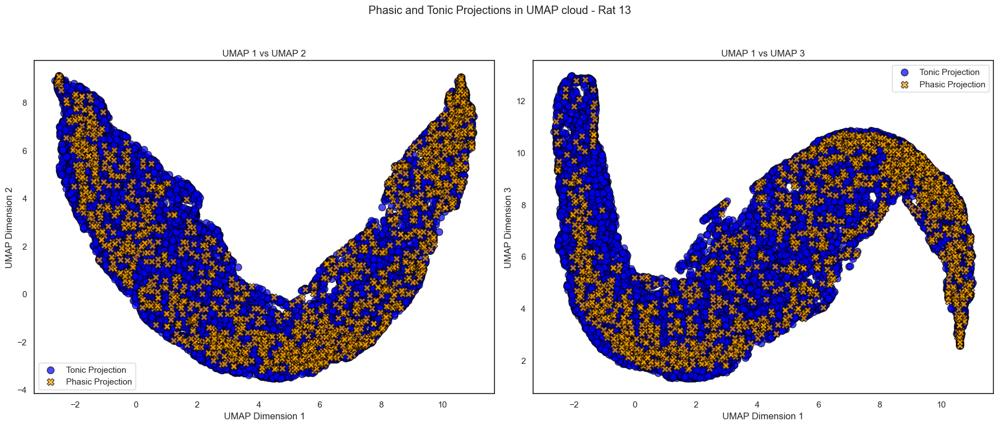

In [65]:
# Merge embedding results with trials data to identify phasic and tonic projections
embedding_df = pd.DataFrame(embedding_rem, columns=["UMAP1", "UMAP2", "UMAP3"])
labeled_embedding = pd.concat([embedding_df, trials_df[['cycle_type']].reset_index(drop=True)], axis=1)

# Separate projections for phasic and tonic cycles
tonic_projection = labeled_embedding[labeled_embedding['cycle_type'] == 'tonic'][["UMAP1", "UMAP2", "UMAP3"]].to_numpy()
phasic_projection = labeled_embedding[labeled_embedding['cycle_type'] == 'phasic'][["UMAP1", "UMAP2", "UMAP3"]].to_numpy()

# Plotting the UMAP projections
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

# First subplot: UMAP 1 vs UMAP 2
axes[0].scatter(tonic_projection[:, 0], tonic_projection[:, 1], color="blue", s=80, alpha=0.7, label="Tonic Projection", edgecolor='black')
axes[0].scatter(phasic_projection[:, 0], phasic_projection[:, 1], color="orange", s=80, alpha=0.7, marker='X', label="Phasic Projection", edgecolor='black')
axes[0].set_xlabel("UMAP Dimension 1")
axes[0].set_ylabel("UMAP Dimension 2")
axes[0].set_title("UMAP 1 vs UMAP 2")
axes[0].legend()

# Second subplot: UMAP 1 vs UMAP 3
axes[1].scatter(tonic_projection[:, 0], tonic_projection[:, 2], color="blue", s=80, alpha=0.7, label="Tonic Projection", edgecolor='black')
axes[1].scatter(phasic_projection[:, 0], phasic_projection[:, 2], color="orange", s=80, alpha=0.7, marker='X', label="Phasic Projection", edgecolor='black')
axes[1].set_xlabel("UMAP Dimension 1")
axes[1].set_ylabel("UMAP Dimension 3")
axes[1].set_title("UMAP 1 vs UMAP 3")
axes[1].legend()

# Display the plot
plt.suptitle(f"Phasic and Tonic Projections in UMAP cloud - Rat {rat_id}")
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.savefig(f"UMAP_for_rat_{rat_id}.svg")
plt.show()

In [ ]:
# plt.figure(figsize=(10, 8))
# sns.scatterplot(
#     data=labeled_embedding,
#     x='UMAP1', y='UMAP2',
#     hue='condition',
#     style='cycle_type',
#     palette='deep',
#     s=80,
#     edgecolor='black',
#     alpha=0.7
# )
# plt.title(f"UMAP Projection Colored by Condition - Rat {rat_id}")
# plt.xlabel("UMAP Dimension 1")
# plt.ylabel("UMAP Dimension 2")
# plt.legend(title='Condition / Cycle Type')
# plt.tight_layout()
# plt.savefig(f"UMAP_condition_rat_{rat_id}.svg")
# plt.show()

In [ ]:
# plt.figure(figsize=(10, 8))
# sns.scatterplot(
#     data=labeled_embedding,
#     x='UMAP1', y='UMAP2',
#     hue='cycle_type',
#     style='condition',
#     palette='Set2',
#     s=80,
#     edgecolor='black',
#     alpha=0.7
# )
# plt.title(f"UMAP Projection Colored by Cycle Type - Rat {rat_id}")
# plt.xlabel("UMAP Dimension 1")
# plt.ylabel("UMAP Dimension 2")
# plt.legend(title='Cycle Type / Condition')
# plt.tight_layout()
# plt.savefig(f"UMAP_cycle_type_rat_{rat_id}.svg")
# plt.show()

In [ ]:
# plt.figure(figsize=(10, 8))
# sns.scatterplot(
#     data=labeled_embedding,
#     x='UMAP1', y='UMAP2',
#     hue='trial',
#     style='condition',
#     palette='viridis',
#     s=80,
#     edgecolor='black',
#     alpha=0.7
# )
# plt.title(f"UMAP Projection Colored by Trial - Rat {rat_id}")
# plt.xlabel("UMAP Dimension 1")
# plt.ylabel("UMAP Dimension 2")
# plt.legend(title='Trial / Condition')
# plt.tight_layout()
# plt.savefig(f"UMAP_trial_rat_{rat_id}.svg")
# plt.show()

## alignment


In [67]:
# Import custom functions
from structure_index import compute_structure_index, draw_graph

In [111]:
# Rotation and Translation of dataset to align it to another dataset (template) based on a feature
# Arguments:
# data = Dataset of size N to be aligned
# feature = an array of size N representing alignment feature
# template_data = Dataset to which (data) will be aligned
# template_feature = an array representing alignment feature of the template data
def align_point_cloud(data, feature,
                      template_data,
                      template_feature,
                      n_bins=15,
                      n_neighbors=15,
                      dims=None,
                      distance_metric='euclidean',
                      discrete_label=False,
                      num_shuffles=10,
                      verbose=False):
    params = {
        'n_bins': n_bins,
        'n_neighbors': n_neighbors,
        'dims': dims,
        'distance_metric': distance_metric,
        'discrete_label': discrete_label,
        'num_shuffles': num_shuffles,
        'verbose': verbose,
    }

    # Get bins from the data
    SI, binLabel, overlapMat, sSI = compute_structure_index(data, np.array(feature), **params)
    SI_temp, binLabel_temp, overlapMat_temp, sSI_temp = compute_structure_index(template_data, np.array(template_feature), **params)

    # Get centroids of bins (p and p'); these are the points that will be aligned
    p = []
    for i in range(params['n_bins']):
        p.append(np.mean(data[binLabel[0] == i], axis=0))
    p = np.array(p)
    
    p_temp = []
    for i in range(params['n_bins']):
        p_temp.append(np.mean(template_data[binLabel_temp[0] == i], axis=0))
    p_temp = np.array(p_temp)

    # q = p - mean(p)
    # Get deviations of points from their means (q and q'); the Qs are used to get the scatter matrix H
    p_mean = np.mean(p, axis=0)
    p_temp_mean = np.mean(p_temp, axis=0)
    q = p - p_mean
    q_temp = p_temp - p_temp_mean

    # Get Rotation matrix
    H = np.dot(q_temp.T, q)
    U, S, Vh = np.linalg.svd(H, full_matrices=True)
    R = np.dot(U, Vh)
    if np.linalg.det(R) < 0:
        Vh[Vh.shape[0]-1, :] = Vh[Vh.shape[0]-1, :] * (-1)
        R = np.dot(U, Vh)

    T = p_temp_mean - np.dot(p_mean, R)
    new_data = np.dot(data, R) + T
    return new_data

In [ ]:
# # Now, define align_point_cloud as provided
# def align_point_cloud(data, feature,
#                       template_data,
#                       template_feature,
#                       n_bins=15,
#                       n_neighbors=15,
#                       dims=None,
#                       distance_metric='euclidean',
#                       discrete_label=False,
#                       num_shuffles=10,
#                       verbose=False):
#     params = {
#         'n_bins': n_bins,
#         'n_neighbors': n_neighbors,
#         'dims': dims,
#         'distance_metric': distance_metric,
#         'discrete_label': discrete_label,
#         'num_shuffles': num_shuffles,
#         'verbose': verbose,
#     }

#     # Get bins from the data
#     SI, binLabel, overlapMat, sSI = compute_structure_index(data, np.array(feature), **params)
#     SI_temp, binLabel_temp, overlapMat_temp, sSI_temp = compute_structure_index(template_data, np.array(template_feature), **params)

#     if binLabel[0] is None or binLabel_temp[0] is None:
#         raise ValueError("Bin labels could not be computed. Check the input features and parameters.")

#     # Get centroids of bins (p and p'); these are the points that will be aligned
#     p = []
#     for i in range(params['n_bins']):
#         bin_indices = np.where(binLabel[0] == i)[0]
#         if bin_indices.size > 0:
#             p.append(np.mean(data[bin_indices], axis=0))
#         else:
#             p.append(np.zeros(data.shape[1]))
#     p = np.array(p)
    
#     p_temp = []
#     for i in range(params['n_bins']):
#         bin_indices = np.where(binLabel_temp[0] == i)[0]
#         if bin_indices.size > 0:
#             p_temp.append(np.mean(template_data[bin_indices], axis=0))
#         else:
#             p_temp.append(np.zeros(template_data.shape[1]))
#     p_temp = np.array(p_temp)

#     # q = p - mean(p)
#     # Get deviations of points from their means (q and q'); the Qs are used to get the scatter matrix H
#     p_mean = np.mean(p, axis=0)
#     p_temp_mean = np.mean(p_temp, axis=0)
#     q = p - p_mean
#     q_temp = p_temp - p_temp_mean

#     # Get Rotation matrix
#     H = np.dot(q_temp.T, q)
#     U, S, Vh = np.linalg.svd(H, full_matrices=True)
#     R = np.dot(U, Vh)
#     if np.linalg.det(R) < 0:
#         Vh[Vh.shape[0]-1, :] = Vh[Vh.shape[0]-1, :] * (-1)
#         R = np.dot(U, Vh)

#     T = p_temp_mean - np.dot(p_mean, R)
#     new_data = np.dot(data, R) + T
#     return new_data

In [ ]:
# Function to extract and embed data for a rat
def extract_and_embed_rat(rat_id, umap_params=None):
    """
    Extracts data for a given rat ID and computes UMAP embeddings.

    Parameters:
    - rat_id: str, ID of the rat
    - umap_params: dict, parameters to pass to UMAP

    Returns:
    - embedding: numpy array of shape (n_samples, n_components)
    - waveforms_df: DataFrame containing the waveform data
    - trials_df: DataFrame containing the trials data
    """
    waveforms_df, trials_df = extract_data_for_rat(rat_id)
    if waveforms_df is None or trials_df is None:
        print(f"No data extracted for Rat {rat_id}.")
        return None, None, None

    # Prepare features for UMAP embedding
    features = waveforms_df.drop(columns=['rat_id', 'condition', 'trial', 'cycle_type', 'SD', 'date'])

    # Set default UMAP parameters if not provided
    if umap_params is None:
        umap_params = {'n_neighbors':15, 'min_dist':0.1, 'n_components':3, 'metric':'euclidean', 'random_state':42}

    # Apply UMAP to the features
    umap_embedder = umap.UMAP(**umap_params)
    embedding = umap_embedder.fit_transform(features.to_numpy())

    return embedding, waveforms_df, trials_df


In [95]:
rat_id_ref = '11'  # Reference rat
embedding_ref, waveforms_df_ref, trials_df_ref = extract_and_embed_rat(rat_id_ref)

Processing recording folder: Rat-OS-Ephys_Rat11_SD1_CON_29-10-2018
Processing trial folder: 2018-10-29_12-41-45_Post_Trial2
There was 0 in the dataset
Number of detected Tonic intrevals:7
Number of detected Tonic intrevals after threshold:7
 Checking Cycles inputs - trimming singleton from input 'IP'
5515
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking Cycles inputs - trimming singleton from input 'IP'
4335
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking Cycles inputs - trimming singleton from input 'IP'
2460
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking Cycles inputs - trimming singleton from input 'IP'
2460
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking Cycles inputs - trimming singleton from input 'IP'
3080
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking Cycles inputs - trimming singleton from input 'IP'
93120
 Checking phase_align inputs - t

In [120]:
rat_id_target = '9'  # Target rat to be aligned

# Extract and embed data for target rat
embedding_target, waveforms_df_target, trials_df_target = extract_and_embed_rat(rat_id_target)

Processing recording folder: Rat-OS-Ephys_Rat9_SD10_OR_04-06-2018
Processing trial folder: 2018-06-04_13-30-45_post_Trial4
There was 0 in the dataset
Number of detected Tonic intrevals:13
Number of detected Tonic intrevals after threshold:12
 Checking Cycles inputs - trimming singleton from input 'IP'
11125
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking Cycles inputs - trimming singleton from input 'IP'
3670
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking Cycles inputs - trimming singleton from input 'IP'
3980
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking Cycles inputs - trimming singleton from input 'IP'
5020
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking Cycles inputs - trimming singleton from input 'IP'
4486
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking Cycles inputs - trimming singleton from input 'IP'
3600
 Checking phase_align inputs - 

In [121]:
# Ensure that the features used for alignment are available
alignment_feature_ref = trials_df_ref['peak_values'].values
alignment_feature_target = trials_df_target['peak_values'].values

In [122]:
# Align embeddings of target rat to reference rat
aligned_embedding_target = align_point_cloud(
    data=embedding_target,
    feature=alignment_feature_target,
    template_data=embedding_ref,
    template_feature=alignment_feature_ref,
    n_bins=20,
    n_neighbors=15
)

In [94]:
# Plotting functions as requested
def plot_phasic_tonic_embeddings(embedding, trials_df, rat_id, title_suffix='', save_fig=False, fig_name='UMAP_plot.svg'):
    """
    Plots phasic and tonic projections in UMAP embedding.

    Parameters:
    - embedding: numpy array of shape (n_samples, n_components)
    - trials_df: DataFrame containing trials data, must include 'cycle_type' column
    - rat_id: str, ID of the rat
    - title_suffix: str, additional title information
    - save_fig: bool, whether to save the figure
    - fig_name: str, filename to save the figure
    """
    # Create embedding DataFrame
    embedding_df = pd.DataFrame(embedding, columns=["UMAP1", "UMAP2", "UMAP3"])
    labeled_embedding = pd.concat([embedding_df, trials_df[['cycle_type']].reset_index(drop=True)], axis=1)

    # Separate projections for phasic and tonic cycles
    tonic_projection = labeled_embedding[labeled_embedding['cycle_type'] == 'tonic'][["UMAP1", "UMAP2", "UMAP3"]].to_numpy()
    phasic_projection = labeled_embedding[labeled_embedding['cycle_type'] == 'phasic'][["UMAP1", "UMAP2", "UMAP3"]].to_numpy()

    # Plotting the UMAP projections
    fig, axes = plt.subplots(1, 2, figsize=(18, 8))

    # First subplot: UMAP 1 vs UMAP 2
    axes[0].scatter(tonic_projection[:, 0], tonic_projection[:, 1], color="blue", s=80, alpha=0.7, label="Tonic Projection", edgecolor='black')
    axes[0].scatter(phasic_projection[:, 0], phasic_projection[:, 1], color="orange", s=80, alpha=0.7, marker='X', label="Phasic Projection", edgecolor='black')
    axes[0].set_xlabel("UMAP Dimension 1")
    axes[0].set_ylabel("UMAP Dimension 2")
    axes[0].set_title("UMAP 1 vs UMAP 2")
    axes[0].legend()

    # Second subplot: UMAP 1 vs UMAP 3
    axes[1].scatter(tonic_projection[:, 0], tonic_projection[:, 2], color="blue", s=80, alpha=0.7, label="Tonic Projection", edgecolor='black')
    axes[1].scatter(phasic_projection[:, 0], phasic_projection[:, 2], color="orange", s=80, alpha=0.7, marker='X', label="Phasic Projection", edgecolor='black')
    axes[1].set_xlabel("UMAP Dimension 1")
    axes[1].set_ylabel("UMAP Dimension 3")
    axes[1].set_title("UMAP 1 vs UMAP 3")
    axes[1].legend()

    # Display the plot
    plt.suptitle(f"Phasic and Tonic Projections in UMAP cloud - Rat {rat_id} {title_suffix}")
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    if save_fig:
        plt.savefig(fig_name)
    plt.show()

def plot_umap_embeddings(embedding, trials_df, metrics, titles, cycle_types=['phasic', 'tonic'], rat_id='', title_suffix='', save_fig=False, fig_name='UMAP_metrics_plot.svg'):
    """
    Plots UMAP embeddings colored by specified metrics.

    Parameters:
    - embedding: numpy array of shape (n_samples, n_components)
    - trials_df: DataFrame containing trials data
    - metrics: list of str, names of metrics in trials_df to plot
    - titles: list of str, titles for the plots
    - cycle_types: list of str, cycle types to plot (default: ['phasic', 'tonic'])
    - rat_id: str, ID of the rat
    - title_suffix: str, additional title information
    - save_fig: bool, whether to save the figure
    - fig_name: str, filename to save the figure
    """
    tonic_cmap = 'Blues'
    phasic_cmap = 'Reds'

    # Separate embeddings and trials data by cycle type
    embedding_df = pd.DataFrame(embedding, columns=["UMAP1", "UMAP2", "UMAP3"])
    labeled_embedding = pd.concat([embedding_df, trials_df.reset_index(drop=True)], axis=1)

    data = {}
    for cycle_type in cycle_types:
        data[cycle_type] = {
            'embedding': labeled_embedding[labeled_embedding['cycle_type'] == cycle_type][["UMAP1", "UMAP2", "UMAP3"]].to_numpy(),
            'trials': labeled_embedding[labeled_embedding['cycle_type'] == cycle_type]
        }

    num_metrics = len(metrics)
    f, ax = plt.subplots(2, num_metrics, figsize=(7*num_metrics, 14))

    for i, metric in enumerate(metrics):
        for idx, (cycle_type, cmap) in enumerate(zip(cycle_types, [tonic_cmap, phasic_cmap])):
            # UMAP-1 vs UMAP-2
            sc = ax[0, i].scatter(data[cycle_type]['embedding'][:, 0], data[cycle_type]['embedding'][:, 1],
                                  c=data[cycle_type]['trials'][metric],
                                  vmin=np.percentile(trials_df[metric], 1),
                                  vmax=np.percentile(trials_df[metric], 99),
                                  cmap=cmap, s=80, label=cycle_type.capitalize(), alpha=0.7, edgecolor='black', marker='X' if cycle_type=='phasic' else 'o')

            ax[0, i].set_xlabel('UMAP-1', fontsize=16)
            ax[0, i].set_ylabel('UMAP-2', fontsize=16)
            ax[0, i].set_title(titles[i], fontsize=16)

            f.colorbar(sc, ax=ax[0, i], label=metric, orientation='vertical')

            # UMAP-1 vs UMAP-3
            sc = ax[1, i].scatter(data[cycle_type]['embedding'][:, 0], data[cycle_type]['embedding'][:, 2],
                                  c=data[cycle_type]['trials'][metric],
                                  vmin=np.percentile(trials_df[metric], 1),
                                  vmax=np.percentile(trials_df[metric], 99),
                                  cmap=cmap, s=80, label=cycle_type.capitalize(), alpha=0.7, edgecolor='black', marker='X' if cycle_type=='phasic' else 'o')

            ax[1, i].set_xlabel('UMAP-1', fontsize=16)
            ax[1, i].set_ylabel('UMAP-3', fontsize=16)
            ax[1, i].set_title(titles[i], fontsize=16)

            f.colorbar(sc, ax=ax[1, i], label=metric, orientation='vertical')

    handles, labels = ax[0, 0].get_legend_handles_labels()
    f.legend(handles, labels, loc='upper right', fontsize=16)

    plt.suptitle(f"UMAP Embeddings with Metrics - Rat {rat_id} {title_suffix}", fontsize=20)
    f.tight_layout(rect=[0, 0.03, 1, 0.95])

    if save_fig:
        plt.savefig(fig_name)

    plt.show()

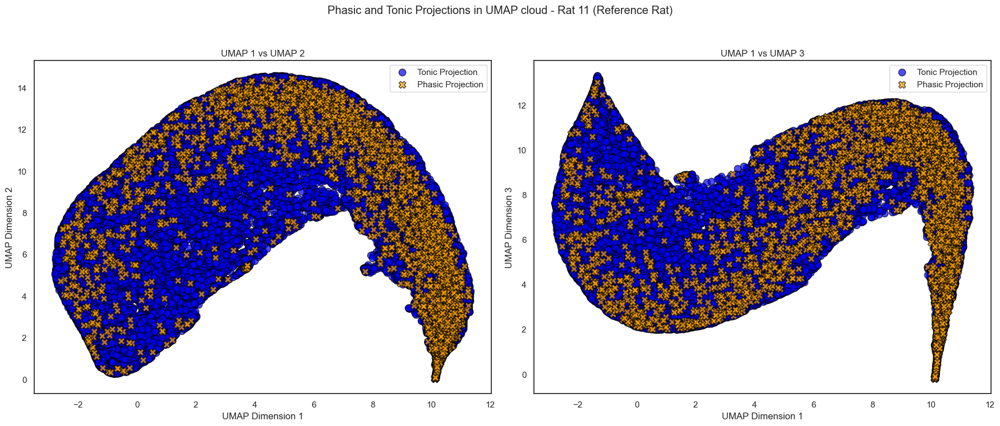

In [99]:
# Plot phasic and tonic projections for reference rat
plot_phasic_tonic_embeddings(
    embedding=embedding_ref,
    trials_df=trials_df_ref,
    rat_id=rat_id_ref,
    title_suffix='(Reference Rat)',
    save_fig=True,
    fig_name=f"UMAP_phasic_tonic_rat_{rat_id_ref}.svg"
)

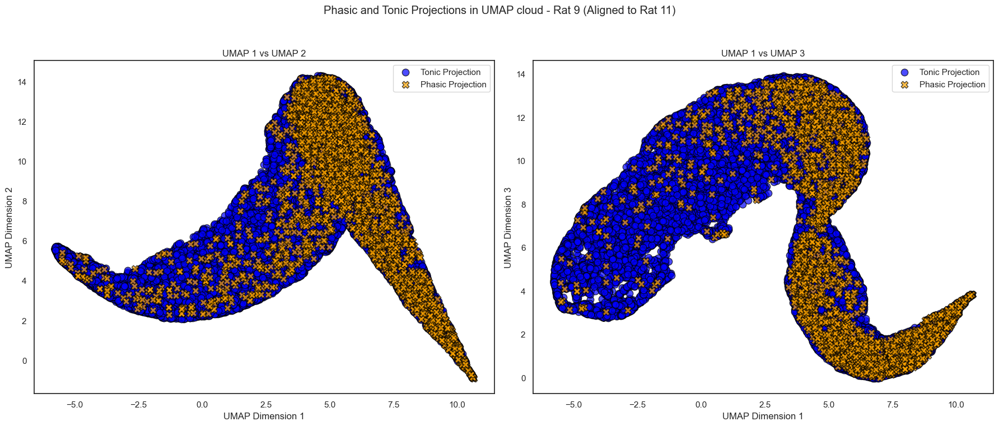

In [123]:

# Plot phasic and tonic projections for aligned target rat
plot_phasic_tonic_embeddings(
    embedding=aligned_embedding_target,
    trials_df=trials_df_target,
    rat_id=rat_id_target,
    title_suffix=f'(Aligned to Rat {rat_id_ref})',
    save_fig=True,
    fig_name=f"UMAP_phasic_tonic_rat_{rat_id_target}_aligned.svg"
)

In [ ]:

# Now, plot embeddings with specified metrics
metrics = ['mode_freqs', 'entropy']  # Replace with your desired metrics
titles = ['Mode Frequencies', 'Entropy']

# For reference rat
plot_umap_embeddings(
    embedding=embedding_ref,
    trials_df=trials_df_ref,
    metrics=metrics,
    titles=titles,
    rat_id=rat_id_ref,
    title_suffix='(Reference Rat)',
    save_fig=True,
    fig_name=f"UMAP_metrics_rat_{rat_id_ref}.svg"
)

# For aligned target rat
plot_umap_embeddings(
    embedding=aligned_embedding_target,
    trials_df=trials_df_target,
    metrics=metrics,
    titles=titles,
    rat_id=rat_id_target,
    title_suffix=f'(Aligned to Rat {rat_id_ref})',
    save_fig=True,
    fig_name=f"UMAP_metrics_rat_{rat_id_target}_aligned.svg"
)

In [107]:
!pip install nbformat


126838.68s - pydevd: Sending message related to process being replaced timed-out after 5 seconds


In [108]:
import plotly.io as pio
pio.renderers.default = 'browser'

In [109]:
from plotly.graph_objs.layout import Scene
from plotly.graph_objs.layout.scene import XAxis, YAxis, ZAxis
import plotly.graph_objects as go

# Create scatter plot for the reference rat
scatter_ref = go.Scatter3d(
    x=embedding_ref[:, 0],
    y=embedding_ref[:, 1],
    z=embedding_ref[:, 2],
    mode='markers',
    marker=dict(
        size=5,
        color=trials_df_ref['peak_values'],  # Color by peak values from reference rat
        colorscale='viridis',  # You can choose a different colorscale if you like
        colorbar=dict(title="Peak Values - Ref Rat")
    ),
    name=f'Rat {rat_id_ref} (Reference)'
)

# Create scatter plot for the aligned target rat
scatter_target = go.Scatter3d(
    x=aligned_embedding_target[:, 0],
    y=aligned_embedding_target[:, 1],
    z=aligned_embedding_target[:, 2],
    mode='markers',
    marker=dict(
        size=5,
        color=trials_df_target['peak_values'],  # Color by peak values from target rat
        colorscale='plasma',  # Different colorscale for target rat if you like
        colorbar=dict(title="Peak Values - Target Rat")
    ),
    name=f'Rat {rat_id_target} (Aligned Target)'
)

# Combine both scatter plots into a single figure
fig = go.Figure(data=[scatter_ref, scatter_target])

# Update the layout of the figure
fig.update_layout(
    autosize=False,
    width=800,
    height=600,
    scene=dict(
        xaxis=dict(title='UMAP-1'),
        yaxis=dict(title='UMAP-2'),
        zaxis=dict(title='UMAP-3')
    ),
    title=f"3D UMAP Embeddings of Rat {rat_id_ref} and Aligned Rat {rat_id_target}",
    showlegend=True
)

# Show the figure
fig.show()


In [112]:
new_emb_orn4 = align_point_cloud(embedding_target, trials_df_target['peak_values'], embedding_ref, trials_df_ref['peak_values'],
                                n_bins=20,
                                n_neighbors=15)

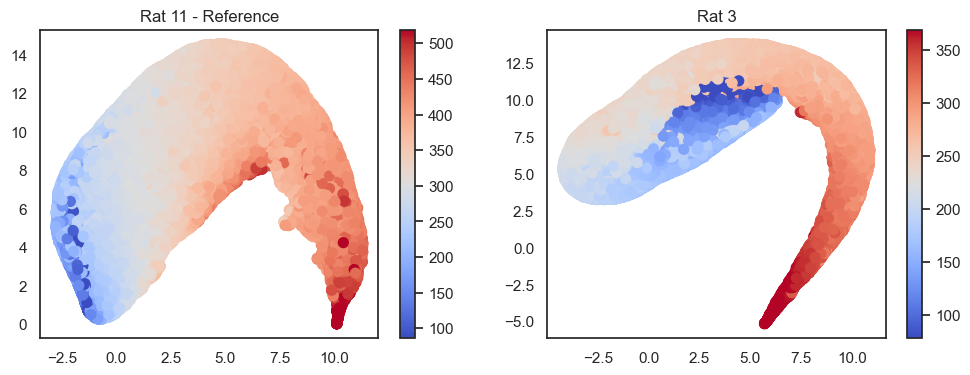

In [118]:
plt.subplots(1,2,figsize=(12,4))

plt.subplot(1,2,1)
plt.scatter(embedding_ref[:,0], embedding_ref[:,1], c=trials_df_ref['peak_values'],
            vmin=np.percentile(trials_df_ref['peak_values'],1),
            vmax=np.percentile(trials_df_ref['peak_values'],99),
            cmap='coolwarm', s=50)
# plt.xlim(-2.5, 12)
plt.colorbar()
plt.title('Rat 11 - Reference')

plt.subplot(1,2,2)
plt.scatter(new_emb_orn4[:,0], new_emb_orn4[:,1], c=trials_df_target['peak_values'],
            vmin=np.percentile(trials_df_target['peak_values'],1),
            vmax=np.percentile(trials_df_target['peak_values'],99),
            cmap='coolwarm', s=50)
# plt.xlim(-2.5, 12)
plt.colorbar()
plt.title('Rat 3');

In [124]:
from plotly.graph_objs.layout import Scene
from plotly.graph_objs.layout.scene import XAxis, YAxis, ZAxis
import plotly.graph_objects as go

scatter1 = go.Scatter3d(
    x=embedding_ref[:, 0],
    y=embedding_ref[:, 1],
    z=embedding_ref[:, 2]+5,
    mode='markers',
    marker=dict(
        size=5,color=trials_df_ref['peak_values'],
        # colorscale='viridis',
    ),
    name='Rat 11'
)

scatter2 = go.Scatter3d(
    x=new_emb_orn4[:, 0],
    y=new_emb_orn4[:, 1],
    z=new_emb_orn4[:, 2],
    mode='markers',
    marker=dict(
        size=5,color=trials_df_target['peak_values'],
        # colorscale='viridis',
    ),
    name='Rat 9'
)

# Combine both scatter plots into a single figure
fig = go.Figure(data=[scatter1, scatter2])

# Update the layout of the figure
fig.update_layout(
    autosize=False,
    width=800,
    height=600,
    scene=dict(
        xaxis=dict(title='UMAP-1'),
        yaxis=dict(title='UMAP-2'),
        zaxis=dict(title='UMAP-3')
    )
)

# Show the figure
fig.show()

In [119]:
# Combine both scatter plots into a single figure
fig = go.Figure(data=[scatter1, scatter2])

# Update the layout of the figure
fig.update_layout(
    autosize=False,
    width=800,
    height=600,
    scene=dict(
        xaxis=dict(title='UMAP-1'),
        yaxis=dict(title='UMAP-2'),
        zaxis=dict(title='UMAP-3')
    )
)

# Show the figure
fig.show()